In [1]:
import numpy as np
import rasterio
import pandas as pd
from tensorflow import keras
from mantle_utils.alg.raster import Raster, plot_rgb
from mantle_utils.alg.stacking.raster import stack_raster_values
from mantle_utils.workflow.metadatadb.artefact import create_s2_tile_idx_search_dict as artefact_create_s2_tile_idx_search_dict
from mantle_utils.workflow.metadatadb.artefact import create_datetime_search_dict as artefact_create_datetime_search_dict
from mantle_utils.workflow.metadatadb.artefact import ArtefactCollection
import pylab as plt
from math import ceil, floor
from tensorflow.keras.layers import Dense
from concurrent.futures import ProcessPoolExecutor
import multiprocessing

2022-03-02 12:24:42.448455: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0


In [2]:
# Tareget tile
s2_tile_idx = '32TPQ'

# Date range (one year)
start_datetime = '20200101'
end_datetime = '20210101'

# Spectral bands
bands = ['B02','B03','B04','B05','B06','B07','B08','B8A','B11','B12']
# bands_QA = ['SCL']

height = 200
width = 200
col_off = 2000
row_off = 2000
aoi = rasterio.windows.Window(col_off=col_off, row_off=row_off, 
                                width=width, height=height)
aoi_20m = rasterio.windows.Window(col_off=col_off/2, row_off=row_off/2,
                                width=width/2, height=height/2)

scl_valid_values = list(range(1,11))
cloud_valid_values = [2,3,7,8,9,10]
# Cloud ratio to create dataset
cloud_threshold = 0.05

In [3]:
# Create search dicts
artefact_tile_search_dict = artefact_create_s2_tile_idx_search_dict(tile_idx=s2_tile_idx)
artefact_datetime_search_dict = artefact_create_datetime_search_dict(
        datetime=None,
        start_datetime=start_datetime,
        end_datetime=end_datetime)

In [4]:
# Search artefacts from metadata DB
artefact_collection = ArtefactCollection()
artefacts = artefact_collection.find_in_db(
    projection_dict={'_id': 0,
                     'workflow_name': 1,
                     'run_name':1,
                     'product_name': 1,
                     'artefact_name': 1,
                     'artefact_path': 1,
                     'artefact_metadata.datetime': 1},
    env_name='production',
    workflow_name='s2-preprocess',
    run_name='v1.0',
    search_dict={'artefact_name': {'$in': bands},
                 **artefact_tile_search_dict,
                 **artefact_datetime_search_dict},
    client=None)

In [5]:
# un-nest artefact_metadata
artefacts = [dict(artefact, **artefact['artefact_metadata']) for artefact in artefacts]
for artefact in artefacts:
    del artefact['artefact_metadata']

# save search result as dataframe
artefacts_df = pd.DataFrame(artefacts).sort_values(['artefact_name', 'product_name'],
                 ignore_index=True, inplace=False)

In [6]:
# Remove repeated artefacts
datetimes = artefacts_df['datetime'].unique()
drop_index = pd.Index([])
for datetime in datetimes:
    tmp_df = artefacts_df[artefacts_df['datetime'] == datetime]
    if len(tmp_df) == len(bands):
        continue
    drop_index = drop_index.union(tmp_df[tmp_df['artefact_path'].str.startswith('s3://sentinel-s2-l2a/')].index)
artefacts_df = artefacts_df.drop(drop_index)

product_names = artefacts_df['product_name'].unique()
product_names.sort()
print(f'Tiles : {len(product_names)}')

Tiles : 138


In [7]:
# Check if artefacts are complete
granules = []
for product_name in product_names:
    bands_artefacts = list(artefacts_df[artefacts_df['product_name']
                                        == product_name]['artefact_name'])
    if all([band in bands_artefacts for band in bands]):
        granules.append(product_name)
n_dates = len(product_names)
print(f'Complete granules : {n_dates}')

Complete granules : 138


In [8]:
df = artefacts_df[artefacts_df['product_name'].isin(granules) 
                  & artefacts_df['artefact_name'].isin(bands)]\
    .sort_values(['datetime', 'artefact_name'], ignore_index=True, inplace=False)

In [9]:
def get_list_of_rasters(dataset_df, raster_path, idx_path):
    bands_10m = ['B02','B03','B04','B08']
    if dataset_df['artefact_name'].iloc[idx_path] in bands_10m:
        raster = Raster(raster_path).clip(mask=aoi,nodata=9999)
    else:
        raster = Raster(raster_path).clip(mask=aoi_20m,nodata=9999).scale(upscale_factor=2)
    return raster

args = ((df, raster_path, idx_path)
        for idx_path, raster_path in enumerate(df['artefact_path']))
with ProcessPoolExecutor(max_workers=8) as executor:
    raster = executor.map(get_list_of_rasters, *zip(*args))
rasters = list(raster)

Warning 6: driver JP2OpenJPEG does not support creation option TILED
Warning 6: driver JP2OpenJPEG does not support creation option TILED
Warning 6: driver JP2OpenJPEG does not support creation option TILED
Warning 6: driver JP2OpenJPEG does not support creation option TILED
Warning 6: driver JP2OpenJPEG does not support creation option TILED
Warning 6: driver JP2OpenJPEG does not support creation option TILED
Warning 6: driver JP2OpenJPEG does not support creation option TILED
Warning 6: driver JP2OpenJPEG does not support creation option TILED
Warning 6: driver JP2OpenJPEG does not support creation option TILED
Warning 6: driver JP2OpenJPEG does not support creation option TILED
Warning 6: driver JP2OpenJPEG does not support creation option TILED
Warning 6: driver JP2OpenJPEG does not support creation option TILED
Warning 6: driver JP2OpenJPEG does not support creation option TILED
Warning 6: driver JP2OpenJPEG does not support creation option TILED
Warning 6: driver JP2OpenJPEG does

In [10]:
array, _ = stack_raster_values(rasters=rasters,
            max_sample_n=None,
            template=0,
            replace_nodata_to_nan=True,
            num_processes=4)

In [11]:
normalized_array = array / 10000

In [12]:
n_bands = len(bands)
n_pixels, n_artefacts = normalized_array.shape
n_dates = int(n_artefacts / n_bands)

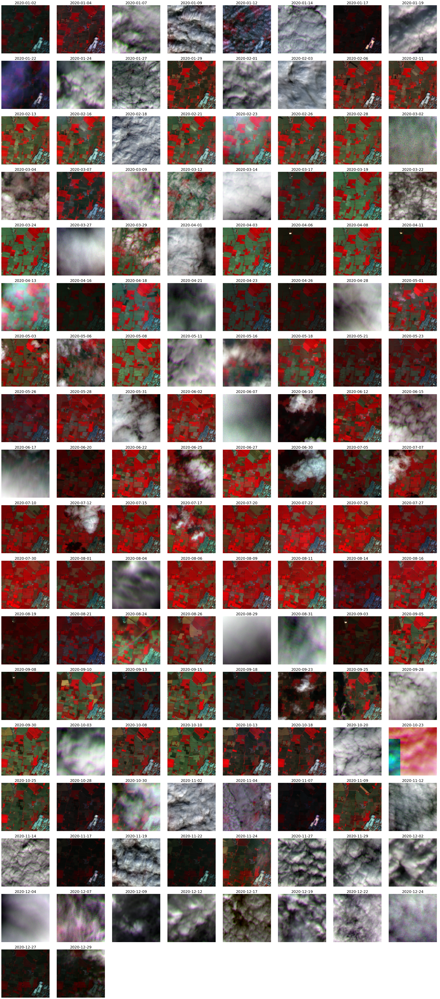

In [13]:
dates_str = df['datetime'].unique()
dates_str = [str(date_str)[:10] for date_str in dates_str]
false_colors = []
n_cols = 8
n_rows = int(ceil(n_dates/n_cols))
plt.rcParams.update({'font.size': 16})
fig, _axs = plt.subplots(n_rows, n_cols, figsize=(n_cols*4,n_rows*4))
axs = _axs.flatten()
for d in range(n_dates):
    B08 = Raster(array=normalized_array[:,d*10+6].reshape(height,width))
    B04 = Raster(array=normalized_array[:,d*10+2].reshape(height,width))
    B02 = Raster(array=normalized_array[:,d*10].reshape(height,width))
    false_colors.append([B08,B04,B02])
    plot_rgb(r=B08, g=B04, b=B02, ax=axs[d])
    axs[d].set(title=dates_str[d])
    axs[d].set_axis_off()
for ax in axs:
    ax.set_axis_off()
plt.tight_layout()


In [ ]:
def generate_pairs(array, n_pairs, time_diff):
    pairs = []
    pair = np.empty((n_pixels, n_bands*2))
    for d in range(n_pairs):
        pair[:,:n_bands] = normalized_array[:,d*10:d*10+10]
        pair[:,n_bands:] = normalized_array[:,(d+time_diff)*10:(d+time_diff)*10+10]
        pairs.append(pair)
    return np.array(pairs)  

In [ ]:
n_pairs = 50
# days_diff = 20
time_diff = 8
pairs = generate_pairs(normalized_array, n_pairs, time_diff).reshape(-1, n_bands*2)

In [ ]:
samples = [1000, 33000, 55000, 212000]
for sample in samples:
    fig, axs = plt.subplots(1,3,figsize=(15,3))
    n_pair = int(sample/n_pixels)
    false_color_1 = false_colors[n_pair]
    false_color_2 = false_colors[n_pair + time_diff]
    axs[0].plot(pairs[sample])
    axs[0].set(title='Two dates pixel combination', xlabel='Band number', ylabel='Reflectance')
    plot_rgb(r=false_color_1[0], g=false_color_1[1], b=false_color_1[2], ax=axs[1])
    plot_rgb(r=false_color_2[0], g=false_color_2[1], b=false_color_2[2], ax=axs[2])
    axs[1].set_axis_off()
    axs[2].set_axis_off()
    axs[1].set(title=dates_str[n_pair])
    axs[2].set(title=dates_str[n_pair+time_diff])
    plt.tight_layout()
    plt.show()

In [ ]:
n_samples = 10000
random_values = np.random.randint(0, pairs.shape[0], n_samples)

x_train = np.array([pairs[px] for px in random_values])
x_test = pairs

In [ ]:
def temp_diff_AE():
    input_data = keras.Input(shape=20)
    encoder = Dense(4, activation='relu')(input_data)
    decoded = Dense(20, activation='sigmoid')(encoder)

    autoencoder = keras.Model(input_data, decoded)

    return autoencoder

In [ ]:
model = temp_diff_AE()
model.summary()

In [ ]:
lr = 0.00005
model.compile(optimizer=keras.optimizers.Adam(learning_rate=lr), loss='mae')

In [ ]:
epochs = 500
validation_split = 0.2
batch_size = 50
history = model.fit(x_train, x_train, 
                    epochs=epochs, 
                    validation_split=validation_split, 
                    batch_size=batch_size,
                    verbose=False)

In [ ]:
train_loss = history.history['loss']
val_loss = history.history['val_loss']

fig, ax = plt.subplots(figsize=(10,5))
ax.plot(train_loss, label='training')
ax.plot(val_loss, label='validation')
ax.set(xlabel='epochs', ylabel='MAE')
ax.legend()
plt.show()

In [ ]:
y_test = model.predict(x_test)

In [ ]:
for sample in samples:
    fig, ax = plt.subplots(figsize=(6,3))
    ax.plot(x_test[sample], 'b')
    ax.plot(y_test[sample], 'r')
    ax.set(title='Two dates pixel combination', xlabel='Band number', ylabel='Reflectance')
    plt.show()